In this notebook we will estimate AR1 models with the trigonometric periodicity component with orders superiors than 1.

In [ ]:
cd((@__DIR__) * raw"\..")
include("../table_reader.jl")
include("../utils/utils.jl")
include("../utils/Missing_values.jl")
series=extract_series("TX_STAID000031.txt")
series=truncate_MV(series,"TX")

include("../utils/Simulation.jl")
Days_list=GatherYearScenario(series[!,2],series.DATE)
avg_day=mean.(Days_list)
max_day=maximum.(Days_list)
df_month = @chain series begin
    @transform(:TEMP = series[!,2]) #Give a common name for TX, TN, etc...
    @transform(:MONTH = month.(:DATE)) #add month column
    @by(:MONTH, :MONTHLY_MEAN = mean(:TEMP), :MONTHLY_STD = std(:TEMP), :MONTHLY_MAX = maximum(:TEMP)) # grouby MONTH + takes the mean/std in each category 
end

Row,MONTH,MONTHLY_MEAN,MONTHLY_STD,MONTHLY_MAX
,Int64,Float64,Float64,Float64
1,1,11.4608,3.35493,21.2
2,2,12.6576,3.45266,22.7
3,3,15.3331,3.15435,26.1
4,4,18.1409,3.08704,28.5
5,5,22.1839,3.35553,33.2
6,6,25.7999,3.08702,36.9
7,7,28.5384,2.88103,40.6
8,8,28.0754,2.74896,38.6
9,9,24.7867,2.93797,33.8


# Order = 2

In this model the periodicity $S_t$ will follow this equation :  $S_t = \mu + a_1\cos(\frac{2πt}{365.25}) + b_1\sin(\frac{2πt}{365.25}) + a_2\cos(2 \times \frac{2πt}{365.25}) + b_2\sin(2 \times \frac{2πt}{365.25})$.

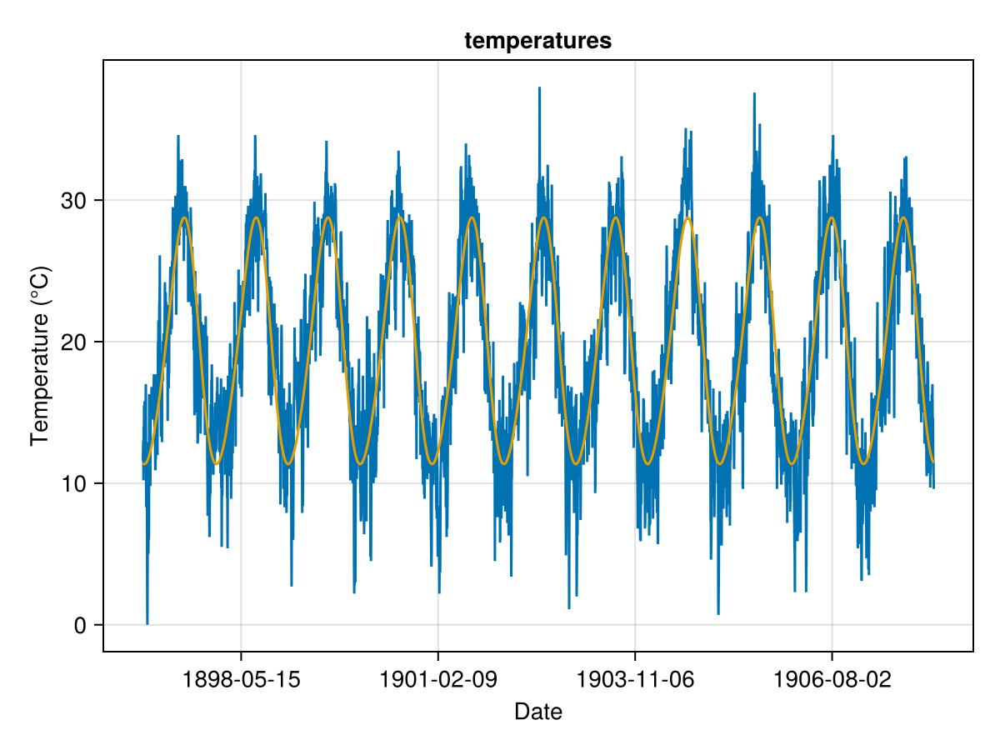

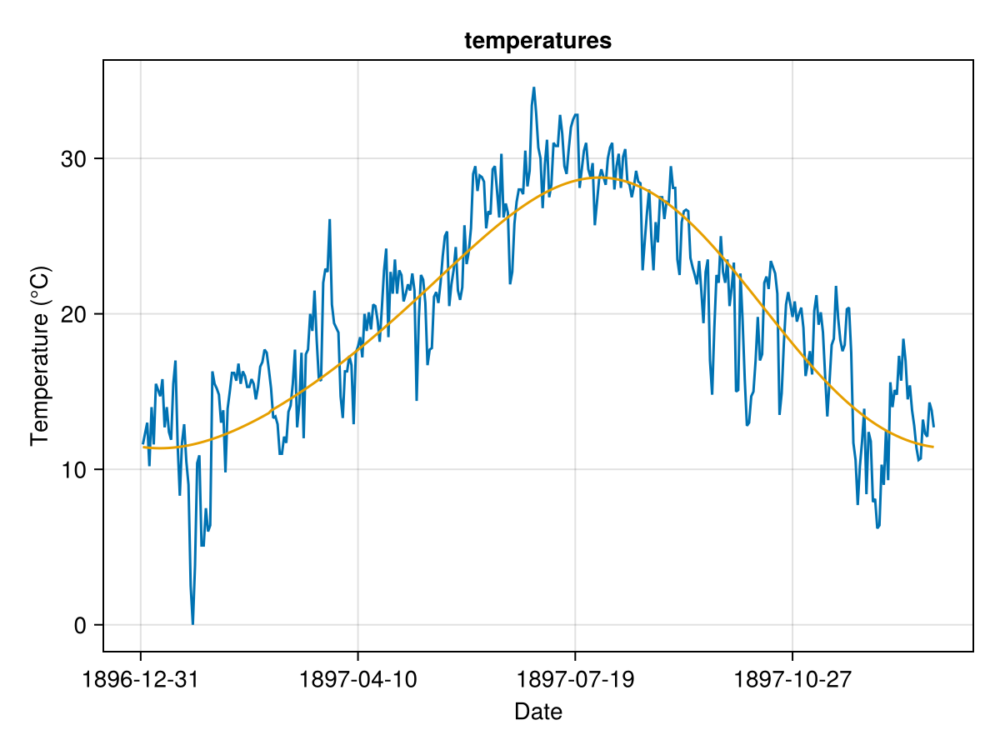

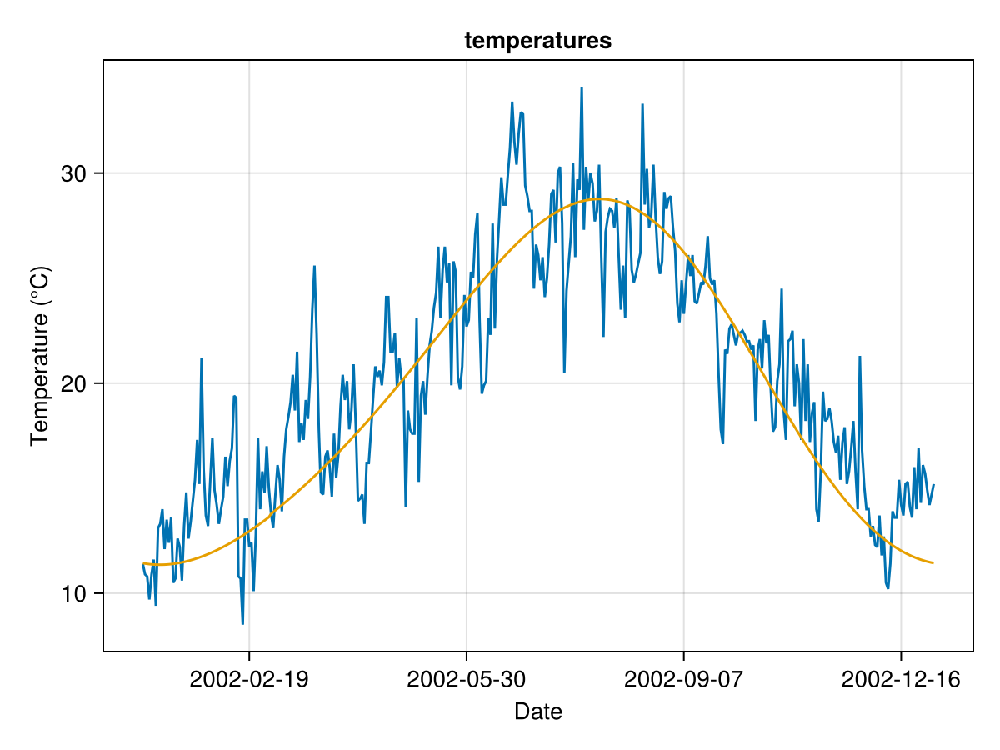

38758-element Vector{Float64}:
  0.16990424312910157
  0.887678833455535
  1.6029762308920539
 -1.1841799047372863
  2.626234851639799
  0.23424564970676798
  4.13987832289992
  3.7431593473804234
  3.344115800888419
  4.44277532153073
  ⋮
  2.7279480284712623
  0.627920107344778
 -0.8728880934175507
 -1.7744729833498916
  0.1231689150622195
  2.920040996818752
  3.316146605235037
  1.8114890631176443
  2.406071704239139

In [38]:
include("../utils/Periodicity.jl")
trigo_function=fitted_periodicity_fonc(series[!,2],series.DATE, OrderTrig=2)
periodicity2=trigo_function.(series.DATE)
period2=trigo_function.(Date(0):Date(1)-Day(1))

Myyear=Iyear(series.DATE,year(series.DATE[1]):year(series.DATE[1]) + 10)
fig1, ax = lines(series.DATE[Myyear],series[Myyear,2])
lines!(ax,series.DATE[Myyear],periodicity2[Myyear])
ax.title="temperatures"
ax.xlabel="Date"
ax.ylabel="Temperature (°C)"
display(fig1)

Myyear=Iyear(series.DATE,year(series.DATE[1]))
fig2, ax = lines(series.DATE[Myyear],series[Myyear,2])
lines!(ax,series.DATE[Myyear],periodicity2[Myyear])
ax.title="temperatures"
ax.xlabel="Date"
ax.ylabel="Temperature (°C)"
display(fig2)

Myyear=Iyear(series.DATE,year(series.DATE[end])-1)
fig3, ax = lines(series.DATE[Myyear],series[Myyear,2])
lines!(ax,series.DATE[Myyear],periodicity2[Myyear])
ax.title="temperatures"
ax.xlabel="Date"
ax.ylabel="Temperature (°C)"
display(fig3)

x=series[!,2]-periodicity2

### Order = 1 versus Order = 2 trigonometric estimation

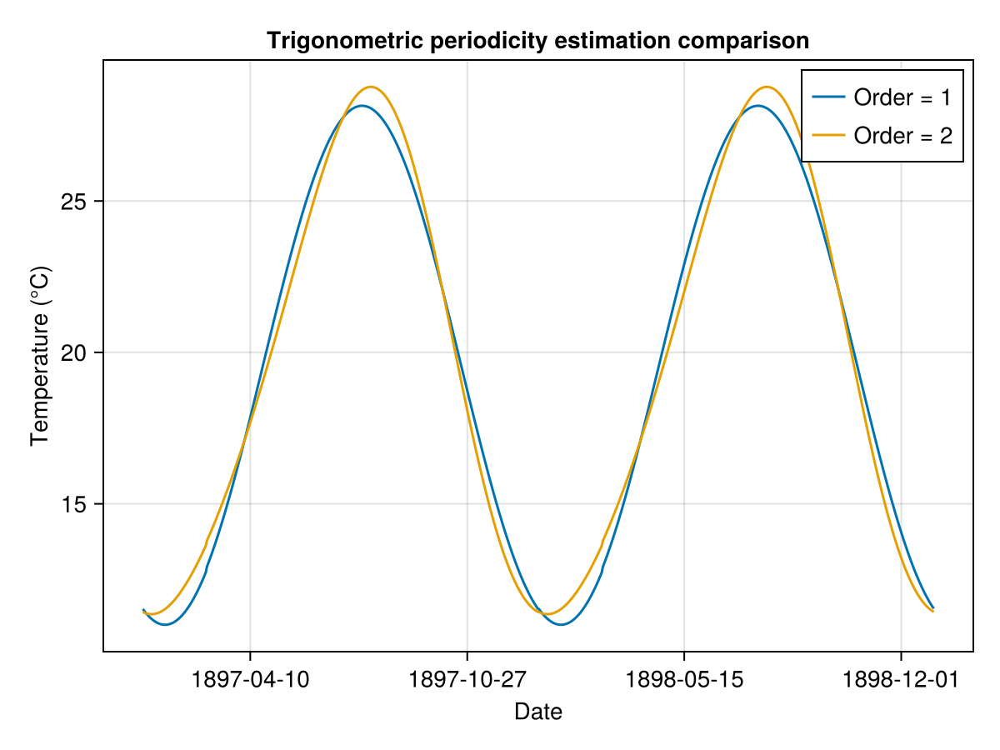

CairoMakie.Screen{IMAGE}


In [39]:
periodicity1=fitted_periodicity_fonc(series[!,2],series.DATE, OrderTrig=1).(series.DATE)

Myyear=Iyear(series.DATE,year(series.DATE[1]):year(series.DATE[1]) + 1)
fig, ax, plt1 = lines(series.DATE[Myyear],periodicity1[Myyear])
plt2 = lines!(ax,series.DATE[Myyear],periodicity2[Myyear])
ax.title="Trigonometric periodicity estimation comparison"
ax.xlabel="Date"
ax.ylabel="Temperature (°C)"
axislegend(ax,[plt1,plt2],["Order = 1","Order = 2"])
display(fig)


## Autocorrelations

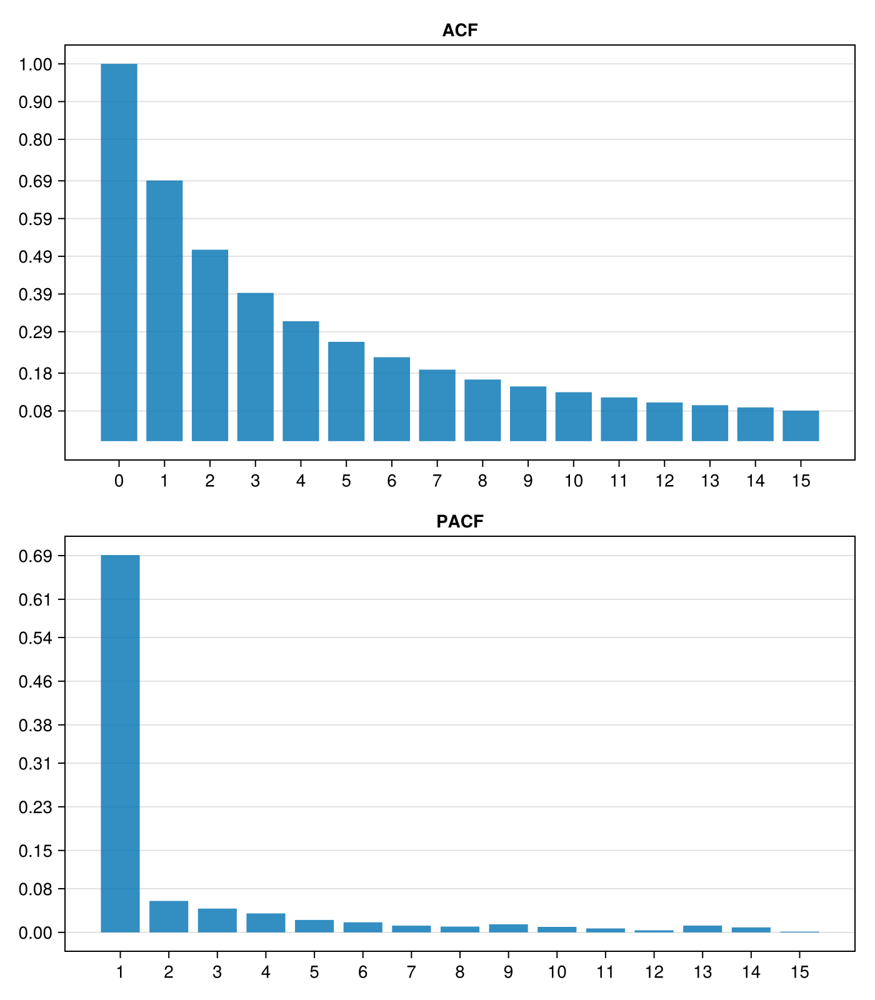

In [40]:
include("../utils/ACF_PACF.jl")
ACF_PACF(x)

It still looks like an AR(1) model

## Estimation with Likelihood : AR(1)

In [41]:
include("../utils/Estimation.jl")
p=1
Φ, σ=LL_AR_Estimation(x,p)

([0.6908944528951166], 2.1887444778180245)

## Sampling simulations

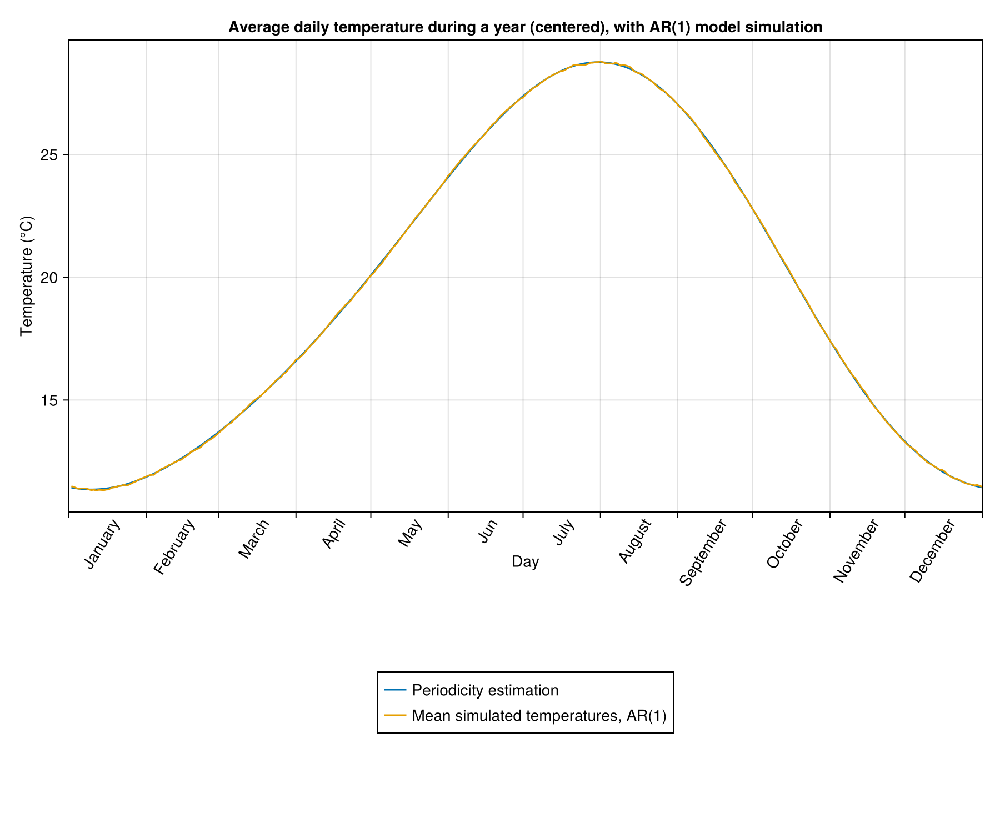

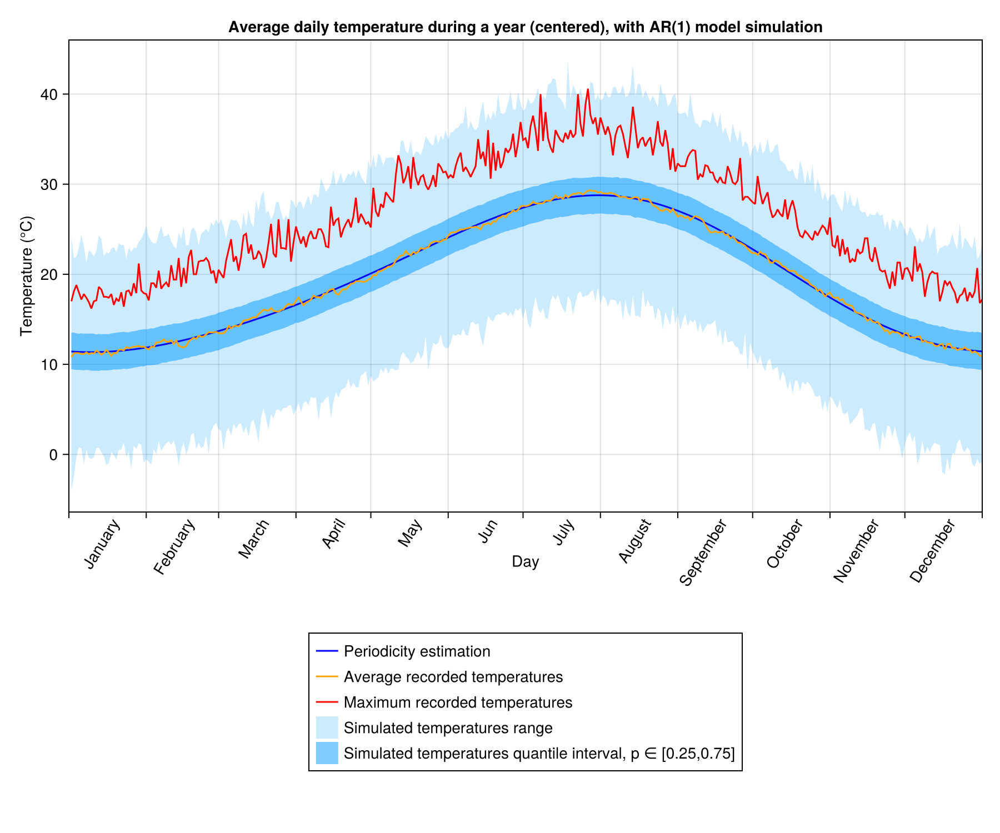

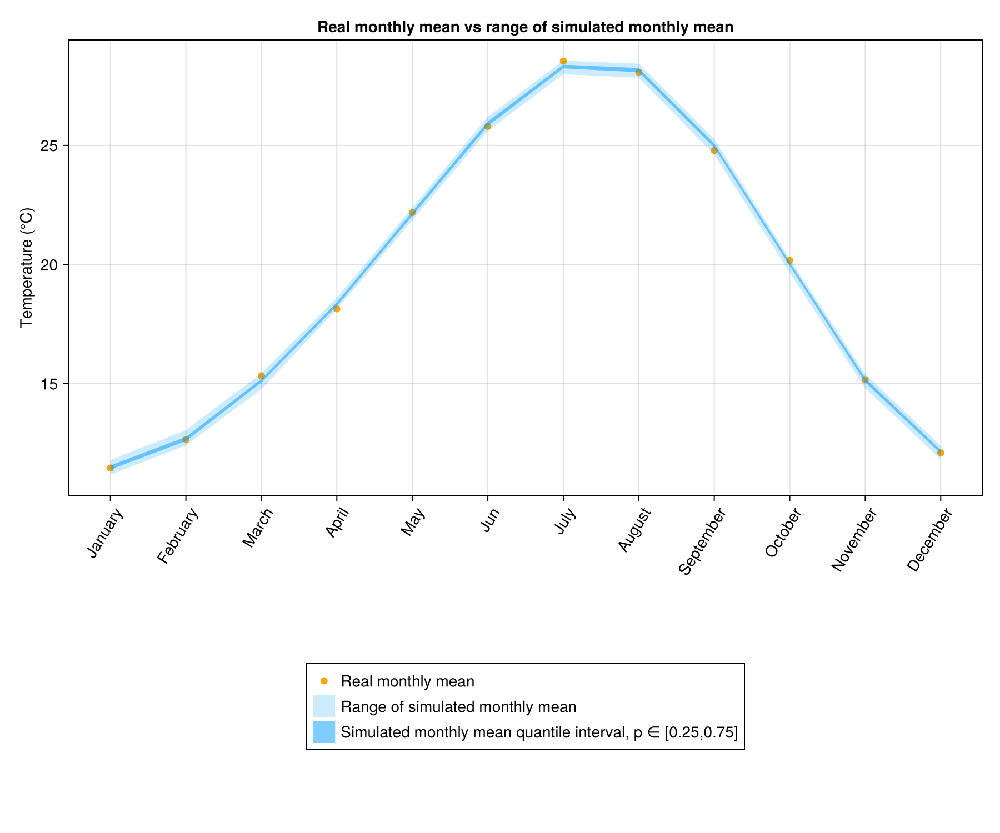

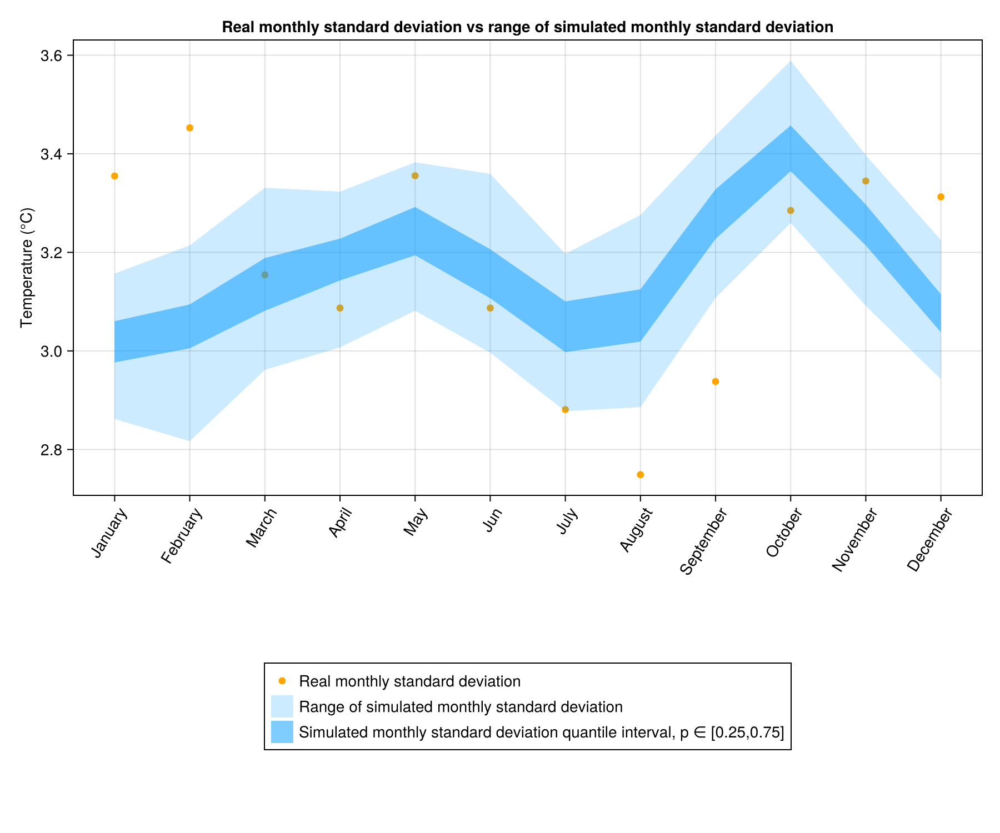

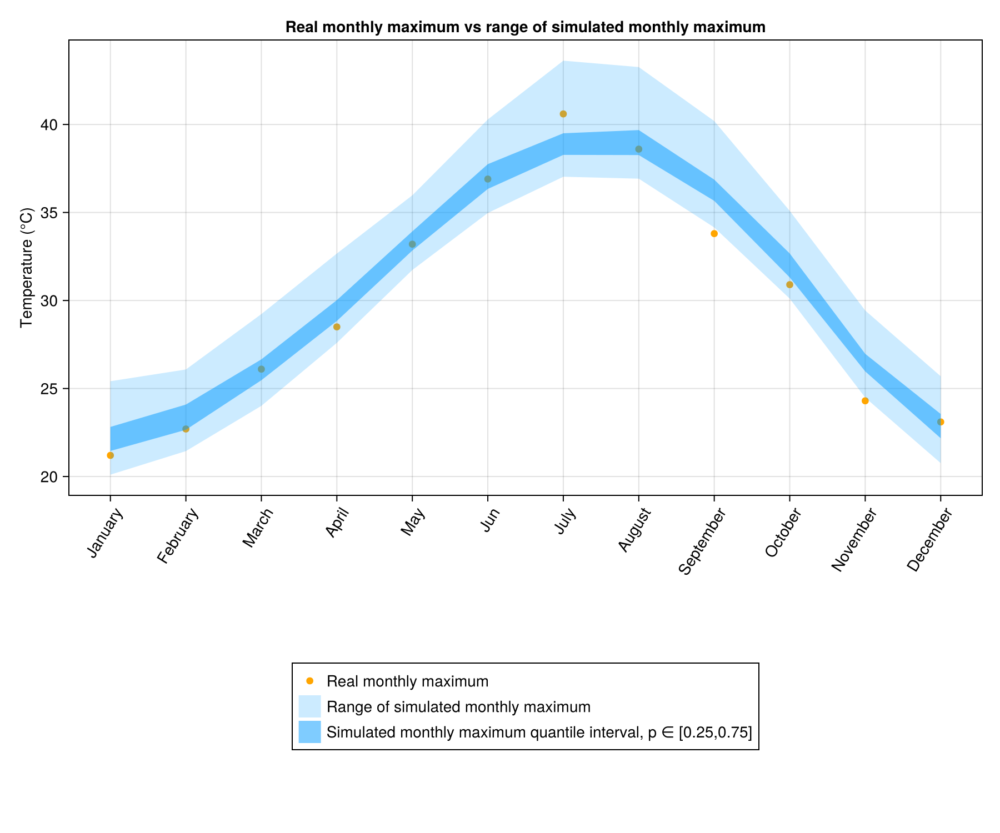

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000002090be45490, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000002

In [42]:
include("../utils/Simulation.jl")
include("../utils/Plotting.jl")
sample_ = SimulateScenarios(x[1:p], series.DATE[1]:series.DATE[end], Φ, σ, period2; n=100)
year_sample = GatherYearScenarios(sample_, series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period2, mean.(year_sample)], ["Periodicity estimation", "Mean simulated temperatures, AR($(p))"], "Average daily temperature during a year (centered), with AR($(p)) model simulation"))
display(PlotYearCurves([period2, avg_day, max_day],
    ["Periodicity estimation", "Average recorded temperatures", "Maximum recorded temperatures", "Simulated temperatures range", "Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
    "Average daily temperature during a year (centered), with AR($(p)) model simulation",
    [(minimum.(year_sample), maximum.(year_sample)), (quantile.(year_sample, 0.25), quantile.(year_sample, 0.75))],
    [("#009bff", 0.2), ("#009bff", 0.5)],
    colors=["blue", "orange", "red"]
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))

## Estimation with Likelihood : AR(2)

In [43]:
include("../utils/Estimation.jl")
p=2
Φ, σ=LL_AR_Estimation(x,p)

([0.6510878746945571, 0.057616612507490096], 2.185134567278813)

## Sampling simulations

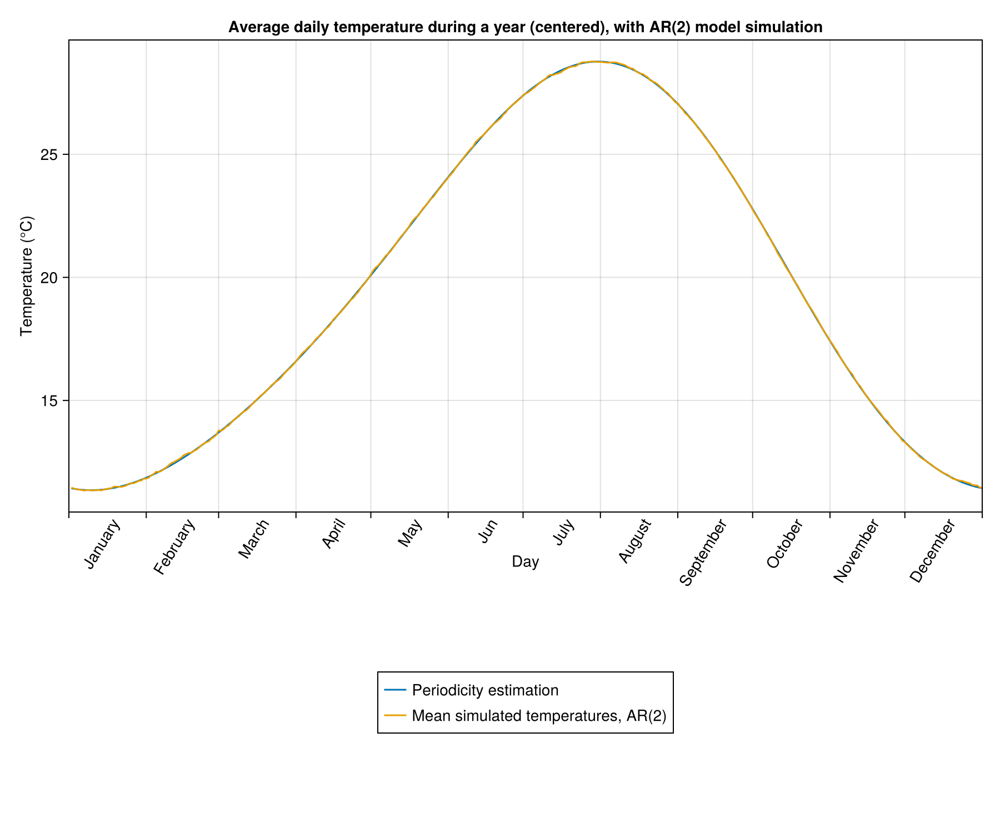

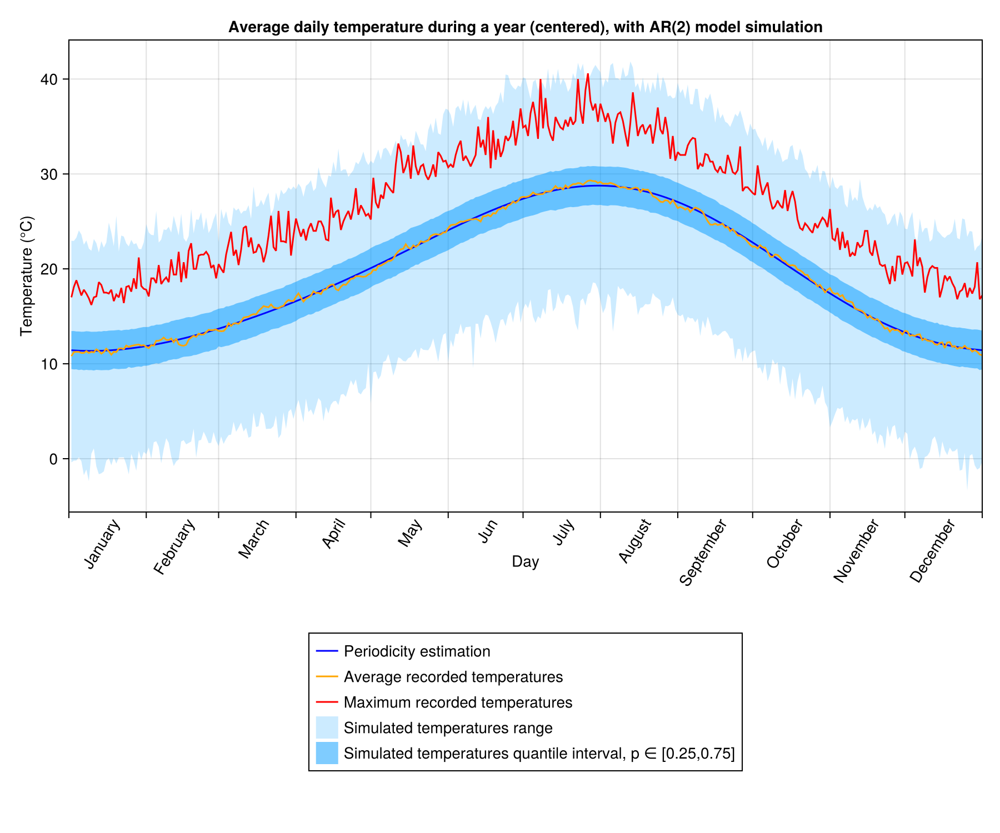

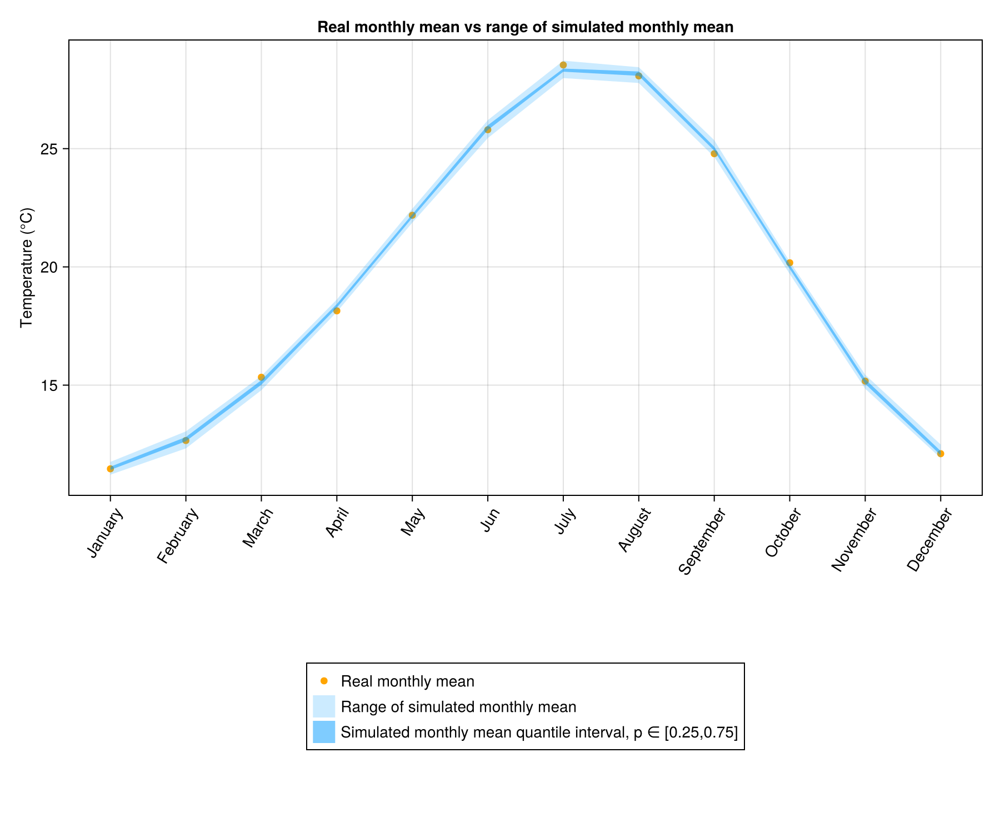

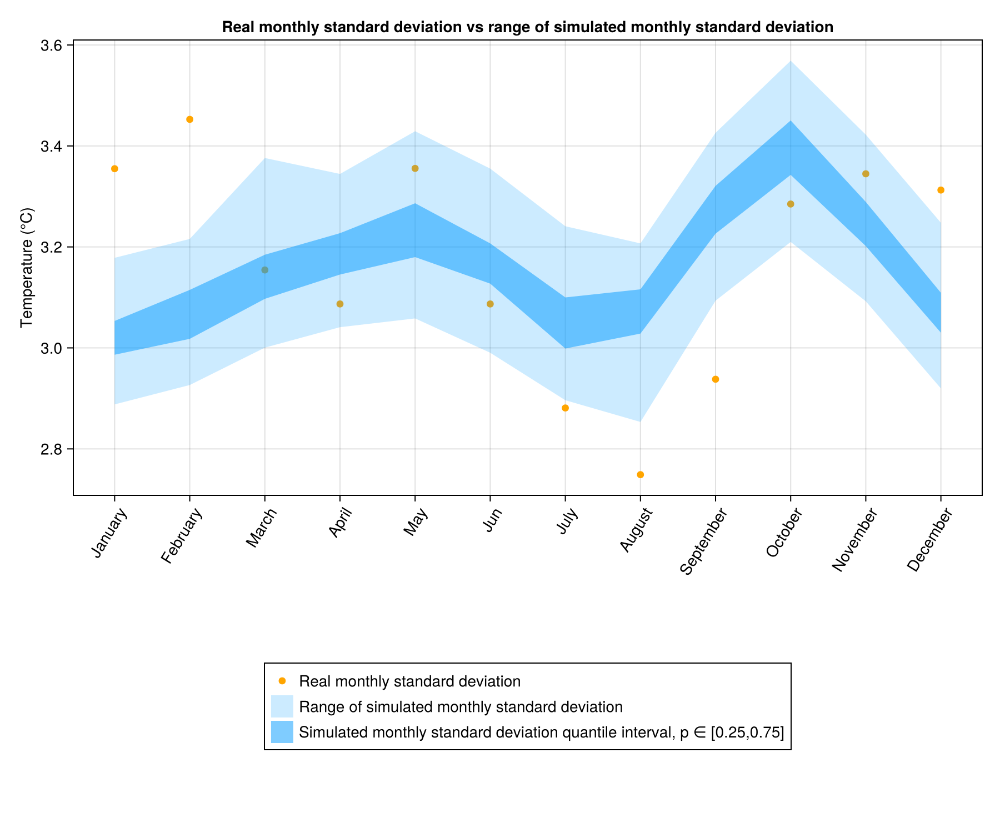

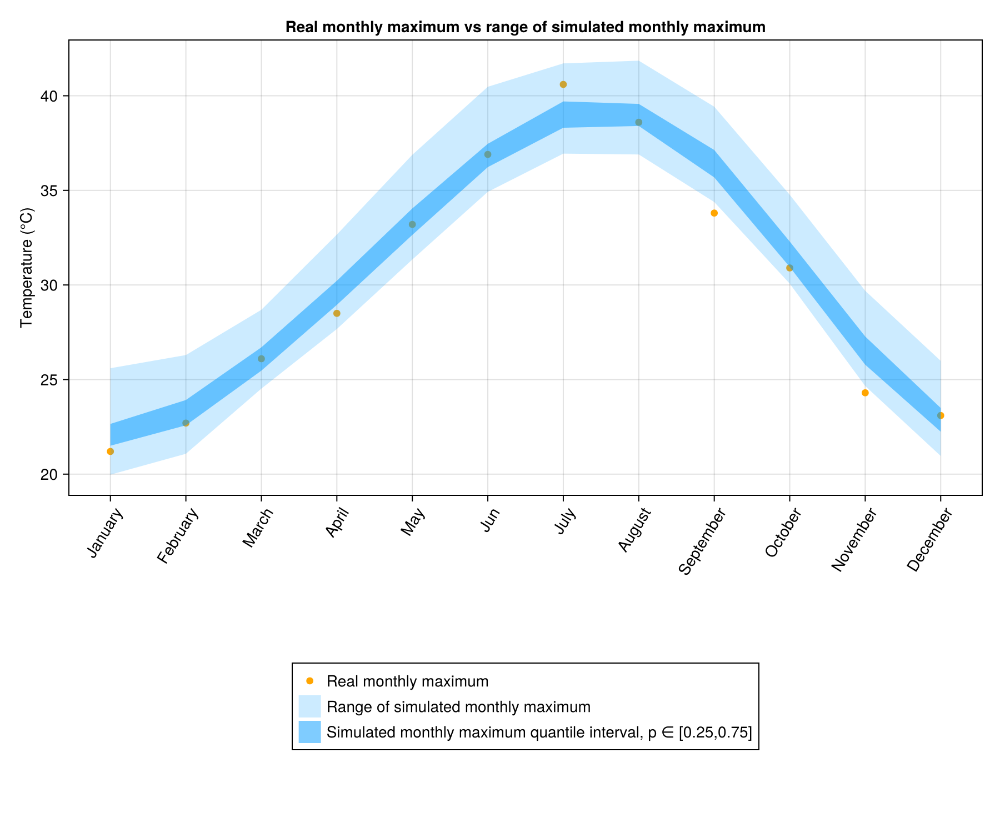

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000002093426b150, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000002

In [44]:
include("../utils/Simulation.jl")
include("../utils/Plotting.jl")
sample_ = SimulateScenarios(x[1:p], series.DATE[1]:series.DATE[end], Φ, σ, period2; n=100)
year_sample = GatherYearScenarios(sample_, series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period2, mean.(year_sample)], ["Periodicity estimation", "Mean simulated temperatures, AR($(p))"], "Average daily temperature during a year (centered), with AR($(p)) model simulation"))
display(PlotYearCurves([period2, avg_day, max_day],
    ["Periodicity estimation", "Average recorded temperatures", "Maximum recorded temperatures", "Simulated temperatures range", "Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
    "Average daily temperature during a year (centered), with AR($(p)) model simulation",
    [(minimum.(year_sample), maximum.(year_sample)), (quantile.(year_sample, 0.25), quantile.(year_sample, 0.75))],
    [("#009bff", 0.2), ("#009bff", 0.5)],
    colors=["blue", "orange", "red"]
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))

# Order = 3

In this model the periodicity $S_t$ will follow this equation :  $S_t = \mu + a_1\cos(\frac{2πt}{365.25}) + b_1\sin(\frac{2πt}{365.25}) + a_2\cos(2 \times \frac{2πt}{365.25}) + b_2\sin(2 \times \frac{2πt}{365.25}) +
a_3\cos(3 \times \frac{2πt}{365.25}) + b_3\sin(3 \times \frac{2πt}{365.25})$.

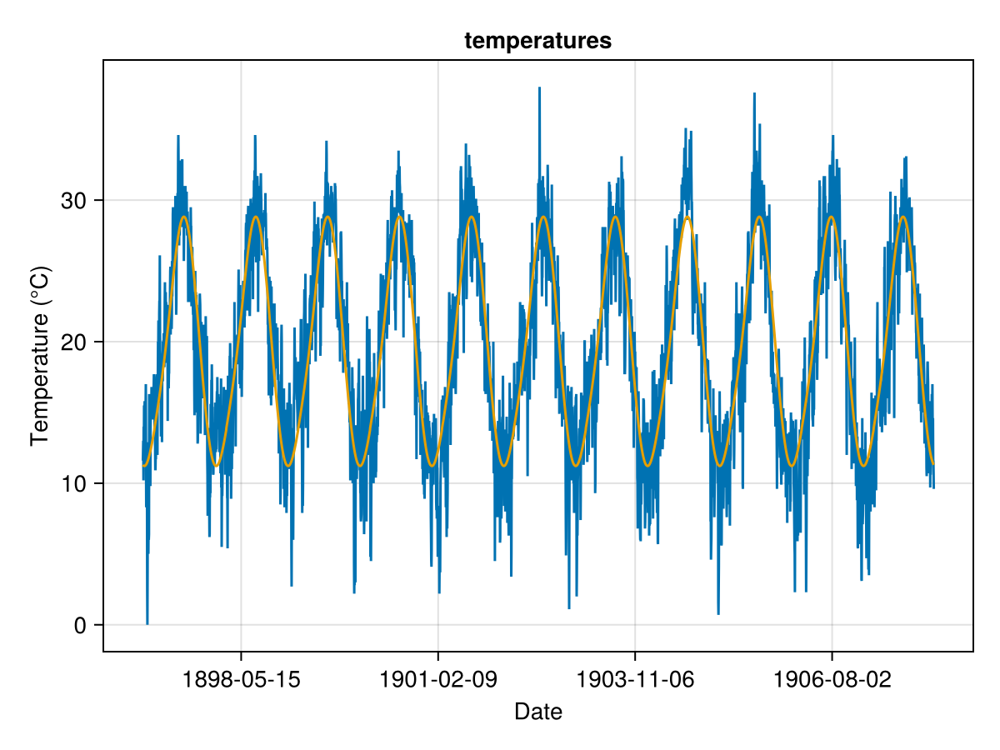

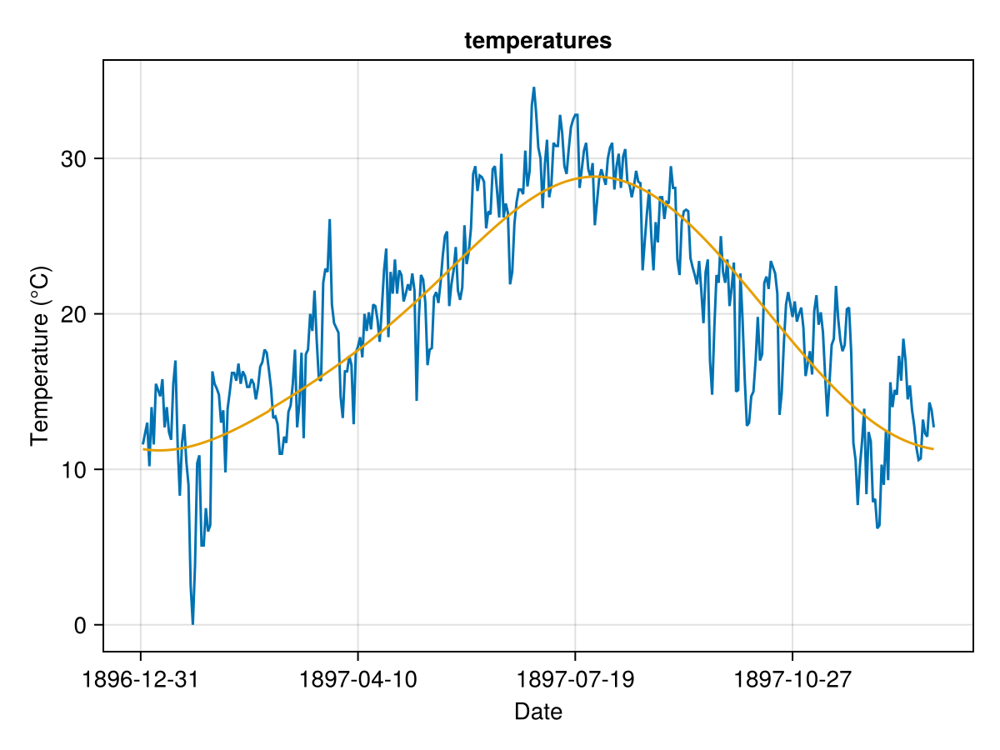

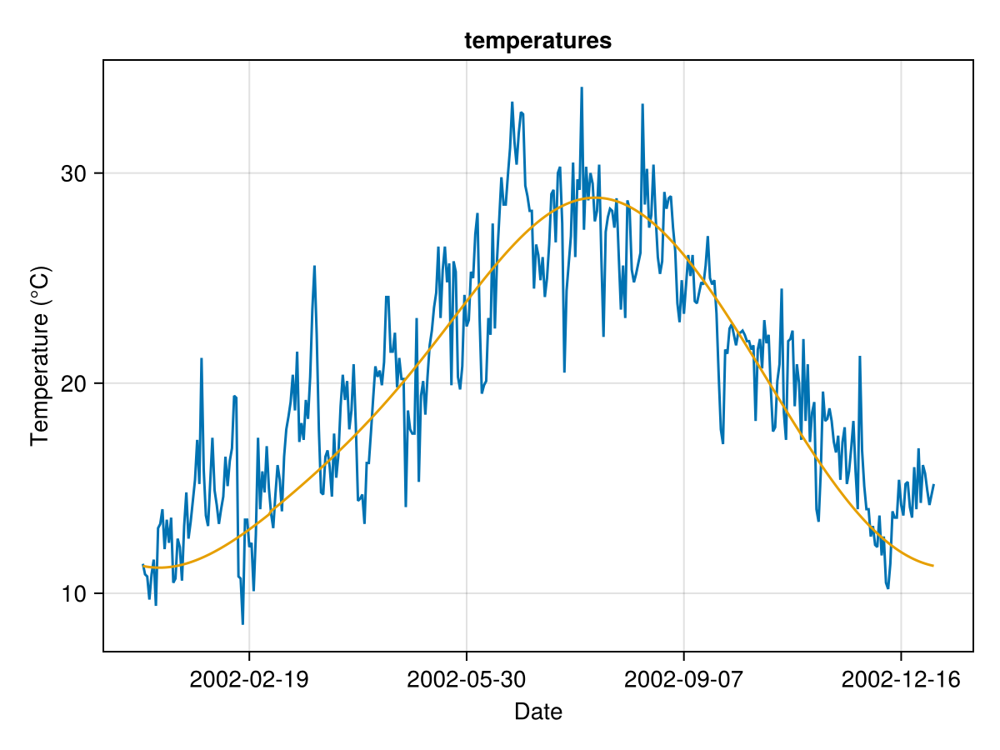

38758-element Vector{Float64}:
  0.3031220105843886
  1.0227502764981207
  1.739537737936601
 -1.0464959409874925
  2.7646706494918156
  0.37306063220811225
  4.278698807622238
  3.8816116155644522
  3.481827094203334
  4.579374836292795
  ⋮
  2.629806840883335
  0.5351673212811061
 -0.9600070677382657
 -1.8557276814811026
  0.0479933976550484
  2.8511434320138918
  3.2537091024317135
  1.7556765837464745
  2.35703162189942

In [45]:
trigo_function=fitted_periodicity_fonc(series[!,2],series.DATE, OrderTrig=3)
periodicity3=trigo_function.(series.DATE)
period3=trigo_function.(Date(0):Date(1)-Day(1))

Myyear=Iyear(series.DATE,year(series.DATE[1]):year(series.DATE[1]) + 10)
fig1, ax = lines(series.DATE[Myyear],series[Myyear,2])
lines!(ax,series.DATE[Myyear],periodicity3[Myyear])
ax.title="temperatures"
ax.xlabel="Date"
ax.ylabel="Temperature (°C)"
display(fig1)

Myyear=Iyear(series.DATE,year(series.DATE[1]))
fig2, ax = lines(series.DATE[Myyear],series[Myyear,2])
lines!(ax,series.DATE[Myyear],periodicity3[Myyear])
ax.title="temperatures"
ax.xlabel="Date"
ax.ylabel="Temperature (°C)"
display(fig2)

Myyear=Iyear(series.DATE,year(series.DATE[end])-1)
fig3, ax = lines(series.DATE[Myyear],series[Myyear,2])
lines!(ax,series.DATE[Myyear],periodicity3[Myyear])
ax.title="temperatures"
ax.xlabel="Date"
ax.ylabel="Temperature (°C)"
display(fig3)

x=series[!,2]-periodicity3

### Comparing orders

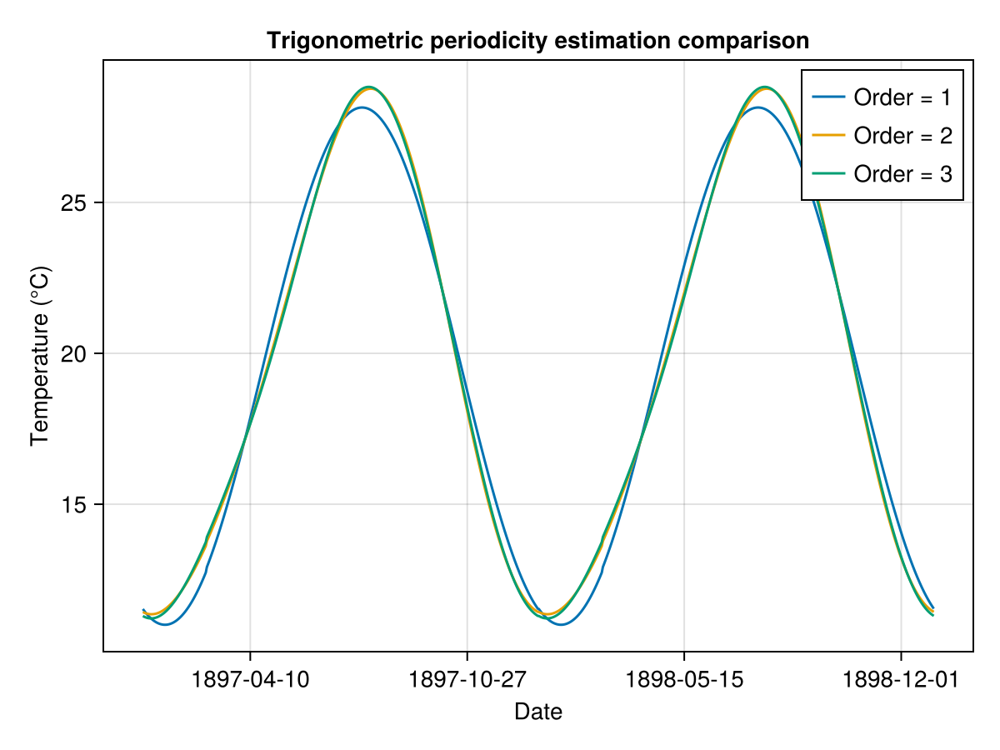

CairoMakie.Screen{IMAGE}


In [46]:

Myyear=Iyear(series.DATE,year(series.DATE[1]):year(series.DATE[1]) + 1)
fig, ax, plt1 = lines(series.DATE[Myyear],periodicity1[Myyear])
plt2 = lines!(ax,series.DATE[Myyear],periodicity2[Myyear])
plt3 = lines!(ax,series.DATE[Myyear],periodicity3[Myyear])
ax.title="Trigonometric periodicity estimation comparison"
ax.xlabel="Date"
ax.ylabel="Temperature (°C)"
axislegend(ax,[plt1,plt2,plt3],["Order = 1","Order = 2","Order = 3"])
display(fig)


## Autocorrelations

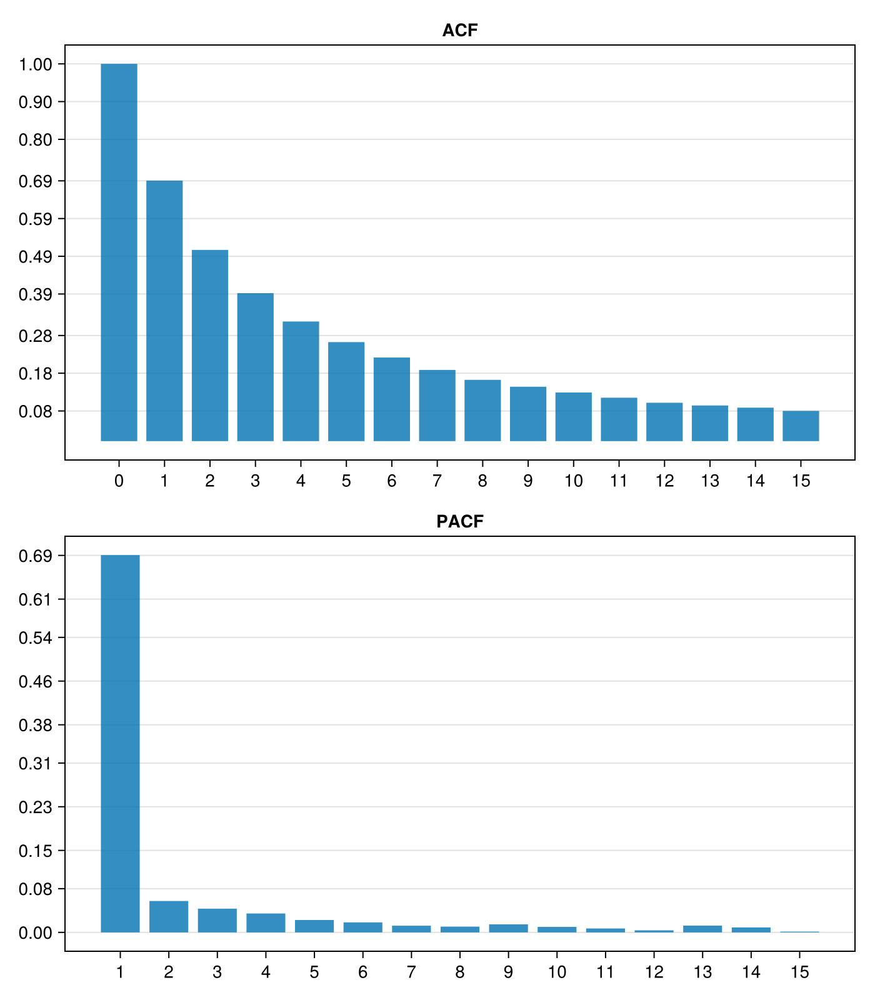

In [47]:
ACF_PACF(x)

It still looks like an AR(1) model

## Estimation with Likelihood : AR(1)

In [48]:
p=1
Φ, σ=LL_AR_Estimation(x,p)

([0.6905599337612793], 2.1885261144360917)

## Sampling simulations

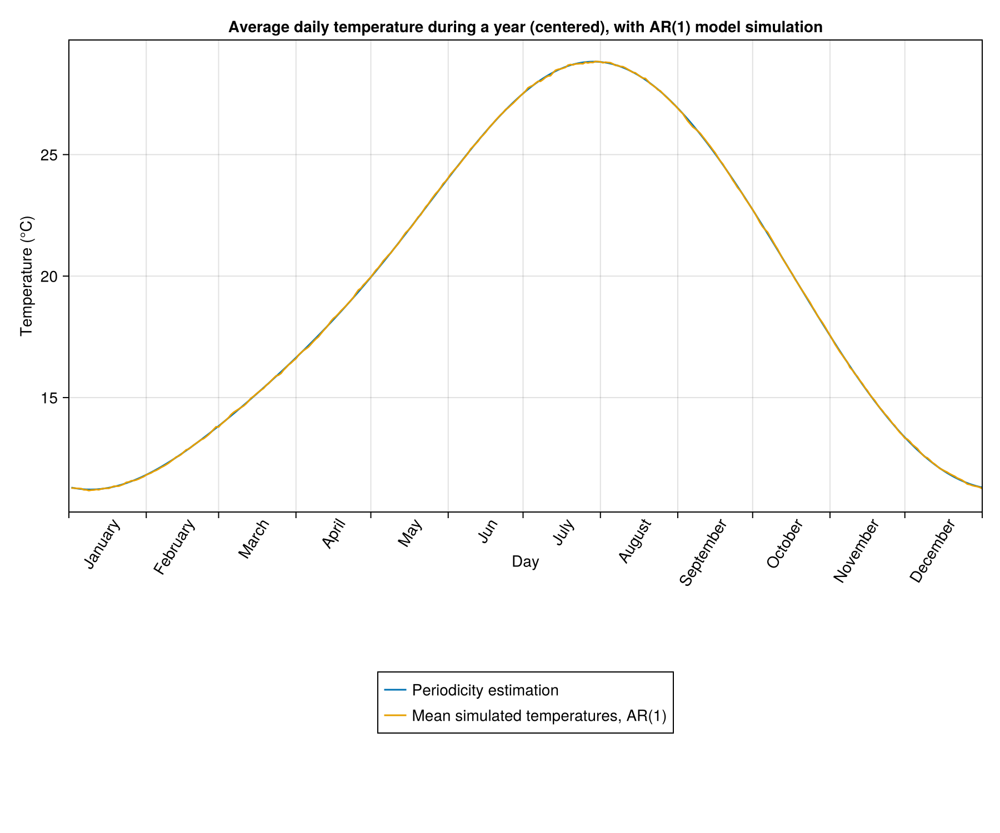

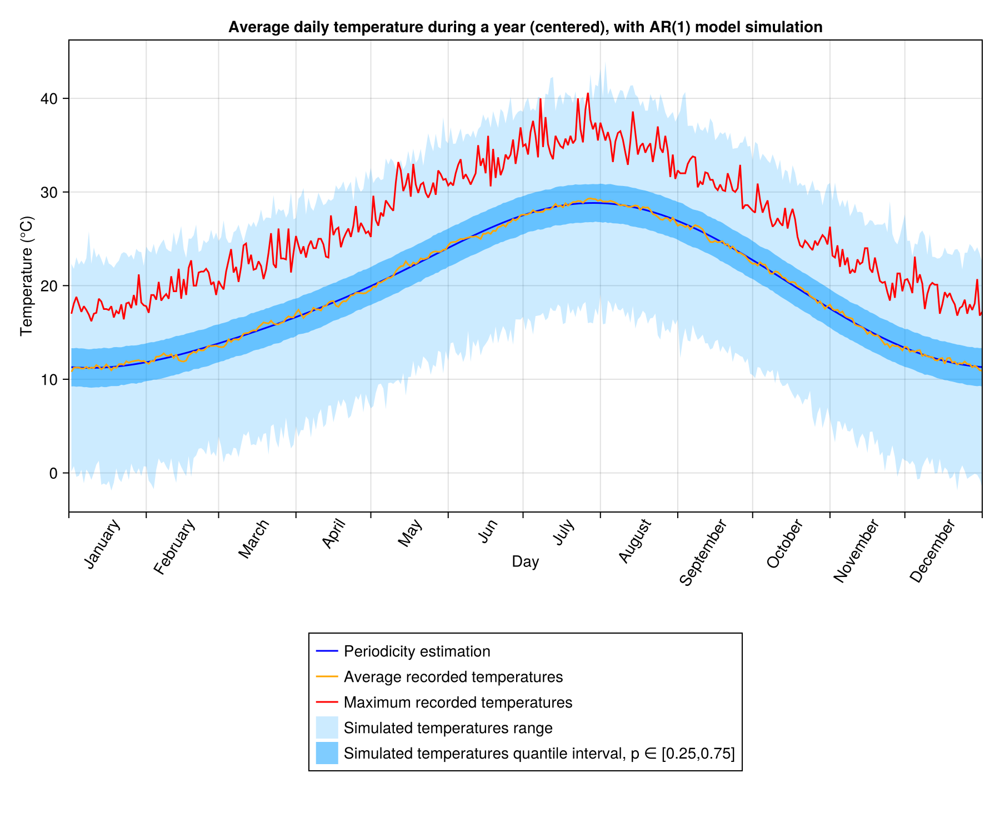

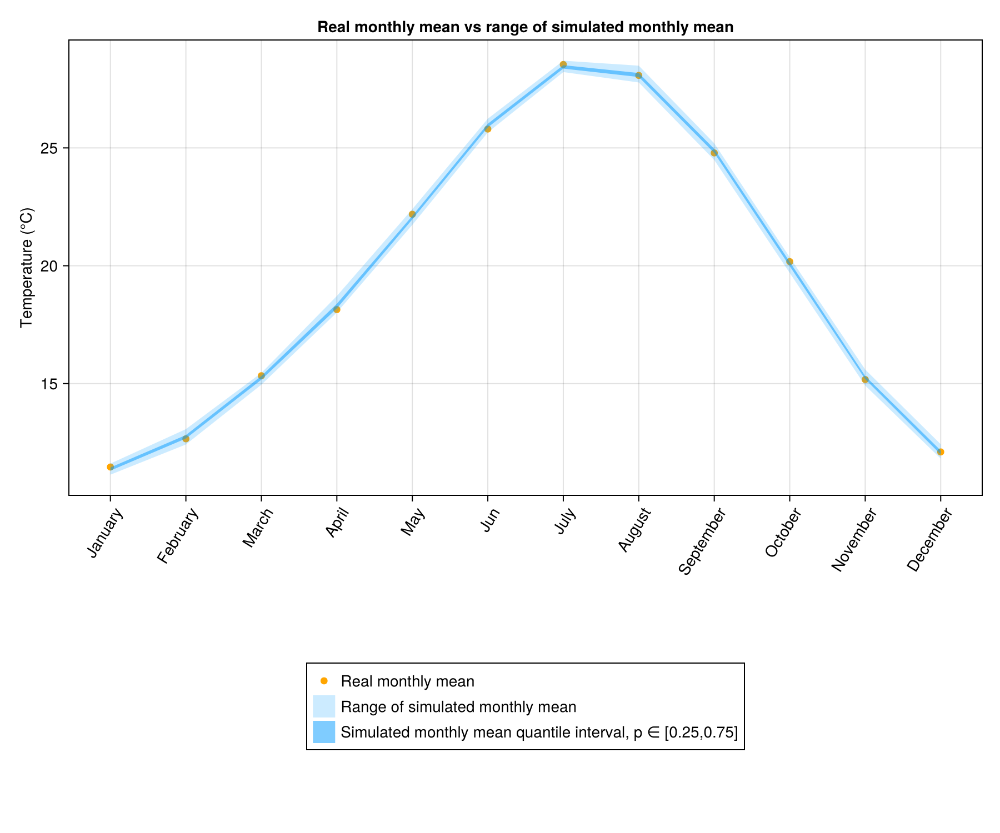

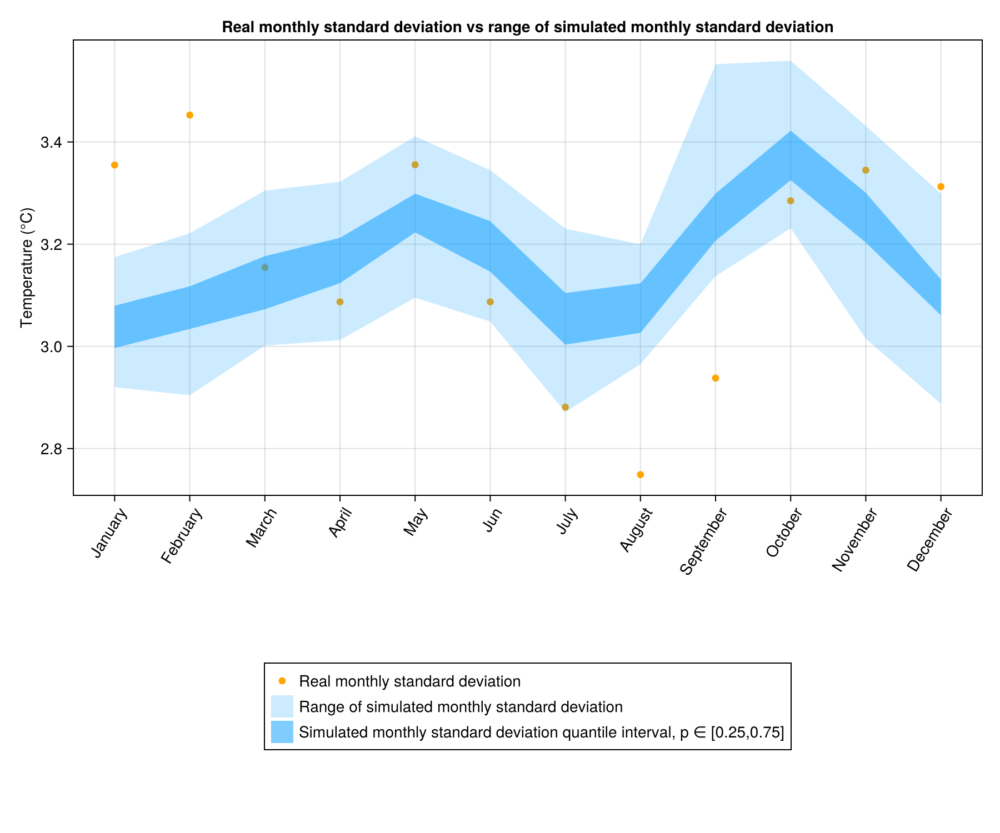

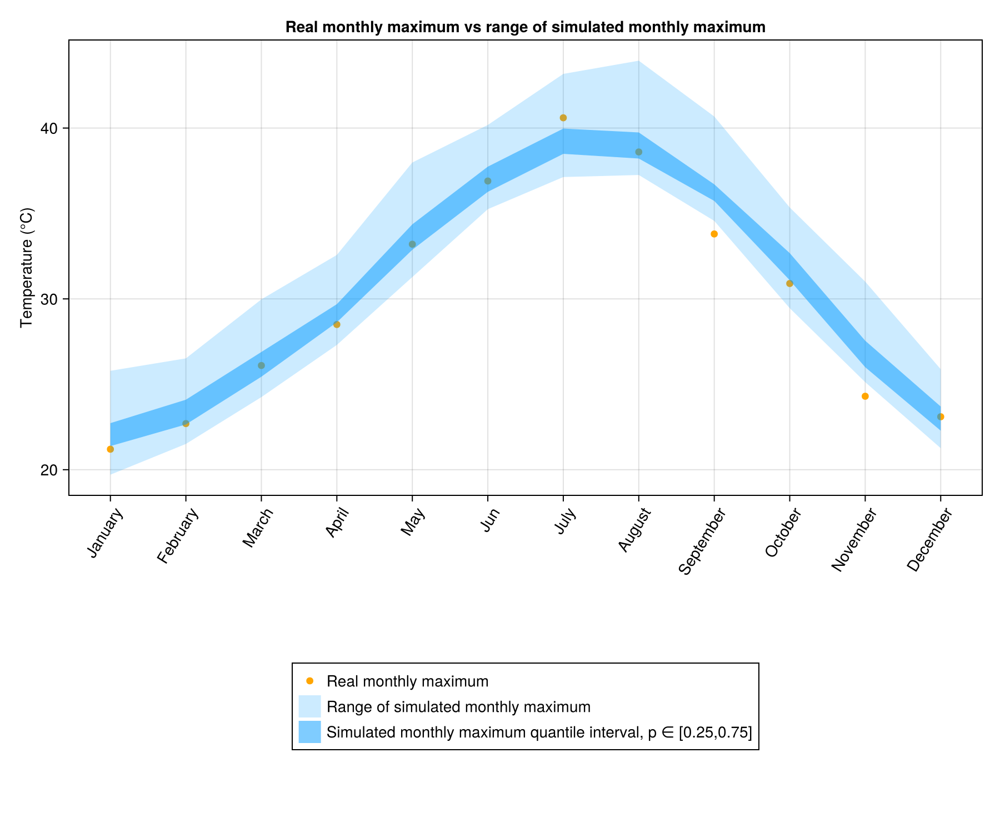

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x00000209342698d0, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000002

In [49]:
sample_=SimulateScenarios(x[1:p], series.DATE[1]:series.DATE[end], Φ, σ, period3; n=100)
year_sample=GatherYearScenarios(sample_, series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period3,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures, AR($(p))"],"Average daily temperature during a year (centered), with AR($(p)) model simulation"))
display(PlotYearCurves([period3,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered), with AR($(p)) model simulation",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))

## Estimation with Likelihood : AR(2)

In [50]:
p = 2
Φ, σ = LL_AR_Estimation(x, p)

([0.6508971496715181, 0.057436440008453576], 2.1849373518517763)

## Sampling simulations

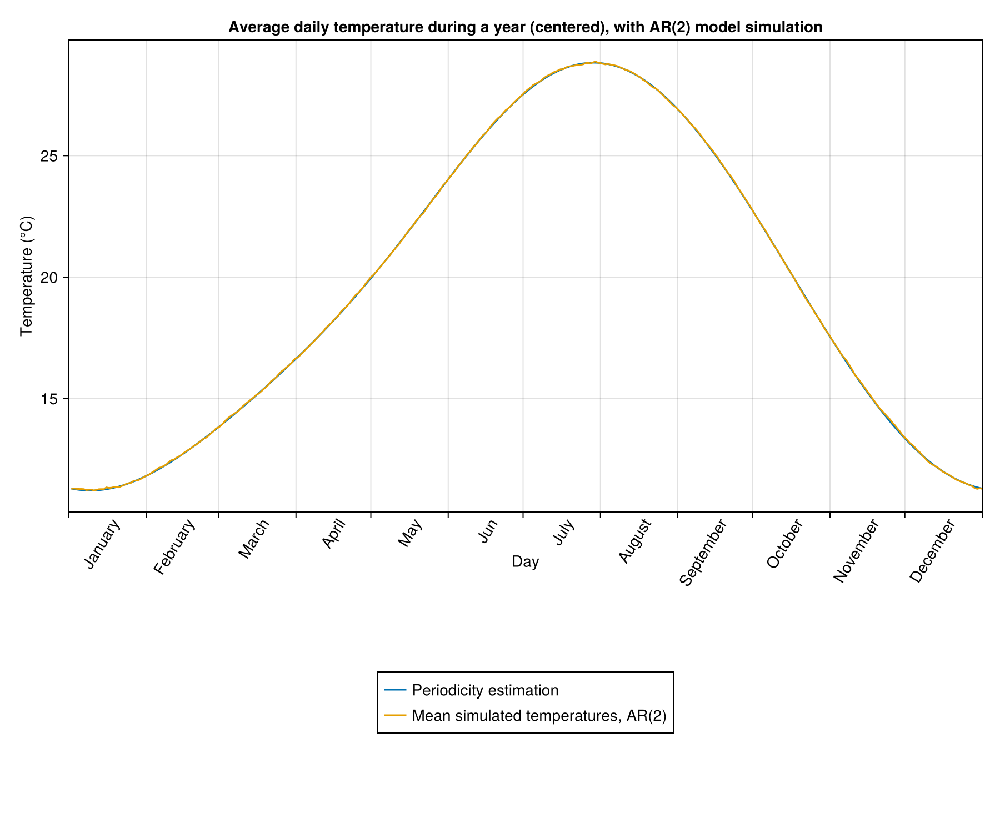

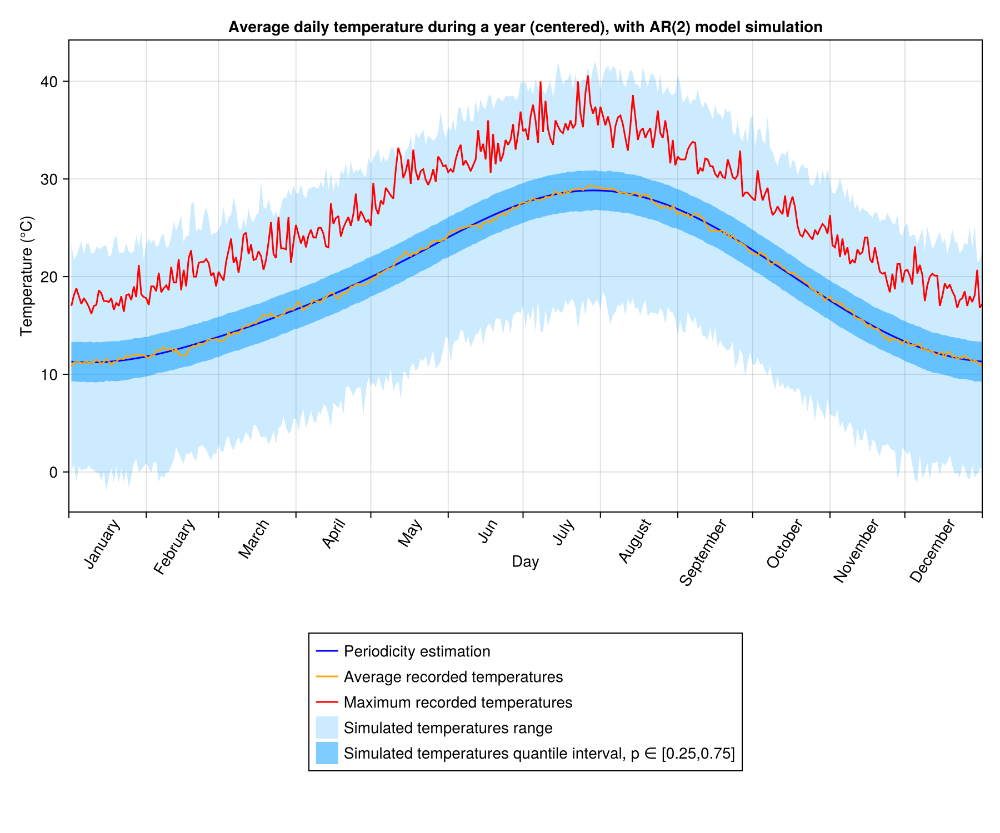

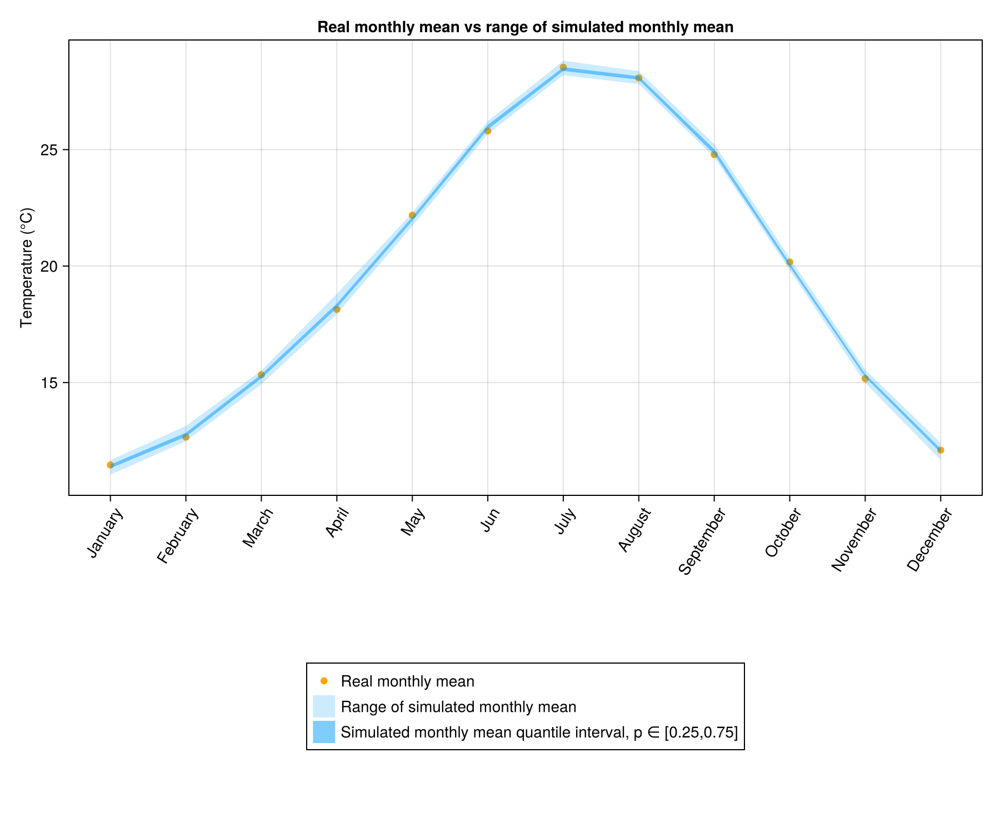

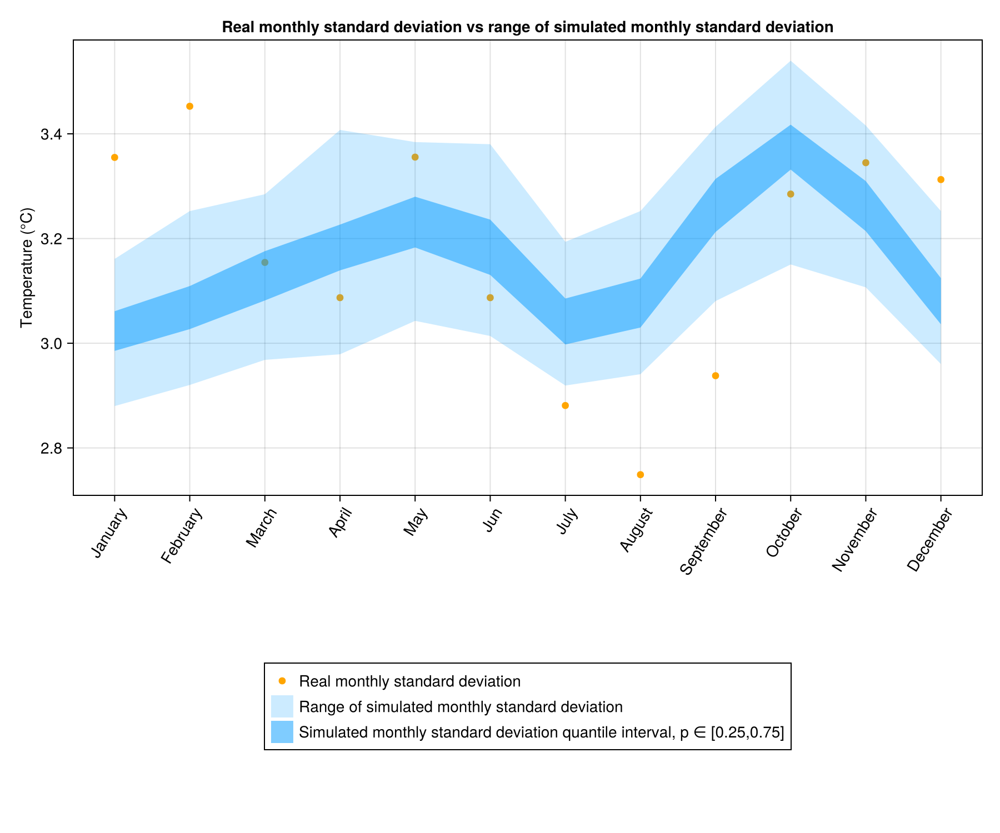

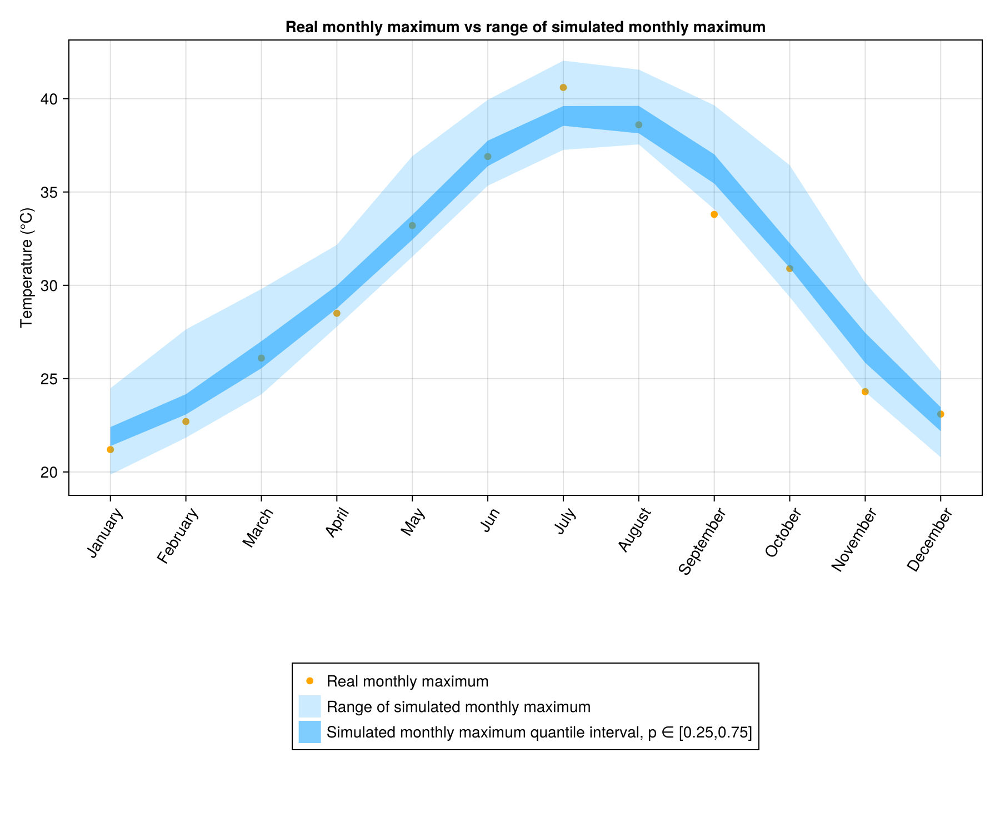

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000002093426bbd0, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000002

In [51]:
sample_ = SimulateScenarios(x[1:p], series.DATE[1]:series.DATE[end], Φ, σ, period3; n=100)
year_sample = GatherYearScenarios(sample_, series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period3, mean.(year_sample)], ["Periodicity estimation", "Mean simulated temperatures, AR($(p))"], "Average daily temperature during a year (centered), with AR($(p)) model simulation"))
display(PlotYearCurves([period3, avg_day, max_day],
    ["Periodicity estimation", "Average recorded temperatures", "Maximum recorded temperatures", "Simulated temperatures range", "Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
    "Average daily temperature during a year (centered), with AR($(p)) model simulation",
    [(minimum.(year_sample), maximum.(year_sample)), (quantile.(year_sample, 0.25), quantile.(year_sample, 0.75))],
    [("#009bff", 0.2), ("#009bff", 0.5)],
    colors=["blue", "orange", "red"]
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))